In [1]:
# Pipeline Analysis Bin2Cell data from 2 um bins with Scanpy
# Author: github.com/acerch

# Following notebooks https://scanpy-tutorials.readthedocs.io/en/latest/spatial/basic-analysis.html
# and https://nbviewer.org/github/Teichlab/bin2cell/blob/main/notebooks/N2_demo_analysis_crc_public.ipynb 

# Data used available in 10X Genomics Data Base: 
# https://www.10xgenomics.com/datasets/visium-hd-cytassist-gene-expression-human-breast-cancer-fresh-frozen

In [2]:
# Import necessary libraries 
import scanpy as sc
import os
import bin2cell as b2c
import celltypist
from celltypist import models
import numpy as np
from matplotlib import rcParams
from matplotlib import font_manager
import matplotlib.pyplot as plt
import squidpy as sq
import seaborn as sns
import pandas as pd
from gprofiler import GProfiler

import time
import psutil

rcParams['pdf.fonttype'] = 42
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 150, vector_friendly = True, format = 'pdf')
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 300, vector_friendly = True, format = 'pdf')
sc.logging.print_versions()

Package,Version
celltypist,1.6.3
gprofiler-official,1.0.0
psutil,7.0.0
Component,Info
Python,"3.10.13 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:15:57) [MSC v.1916 64 bit (AMD64)]"
OS,Windows-10-10.0.26100-SP0
CPU,"32 logical CPU cores, AMD64 Family 25 Model 33 Stepping 0, AuthenticAMD"
GPU,No GPU found
Updated,2025-07-03 09:39
Dependency,Version


In [3]:
# Initial time
start_time = time.time()
# Initial memory
process = psutil.Process(os.getpid())
start_mem = process.memory_info().rss / 1e6 # in MB 

In [4]:
# Load AnnData b2c object
bdata = sc.read_h5ad('../../Data/Processed/b2c_breastFF.h5ad')
bdata

AnnData object with n_obs × n_vars = 182540 × 16746
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer'

In [5]:
# Calculate the standards QC metrics with scanpy.pp.calculate_qc_metrics() 
# and the percentage of mitochondrial read counts per sample
bdata.var["mt"] = bdata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(bdata, qc_vars=["mt"], inplace=True)
bdata

AnnData object with n_obs × n_vars = 182540 × 16746
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer'

In [6]:
print("The number of MT genes identified in the data are:", sum(bdata.var["mt"]))

The number of MT genes identified in the data are: 11


<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

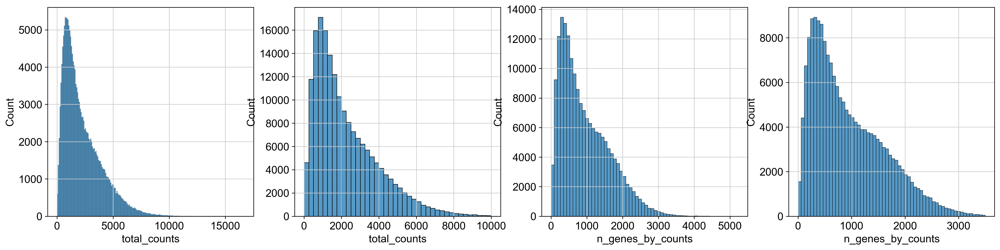

In [7]:
# QC and preprocessing 
# Visiualization Plots for QC 
fig, axs = plt.subplots(1, 4, figsize=(22, 5))
sns.histplot(bdata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(
    bdata.obs["total_counts"][bdata.obs["total_counts"] < 10000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.histplot(bdata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(
    bdata.obs["n_genes_by_counts"][bdata.obs["n_genes_by_counts"] < 3500],
    kde=False,
    bins=60,
    ax=axs[3],
)

In [8]:
# Filtering of the data 
sc.pp.filter_cells(bdata, min_counts=81)
sc.pp.filter_cells(bdata, min_genes=81)
bdata = bdata[bdata.obs["pct_counts_mt"] < 30].copy()
sc.pp.filter_genes(bdata, min_cells=5)
print(f"Bins after filter: {bdata.n_obs}")
print(f"Genes after filter: {bdata.n_vars}")
bdata

Bins after filter: 179660
Genes after filter: 16209


AnnData object with n_obs × n_vars = 179660 × 16209
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer'

<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

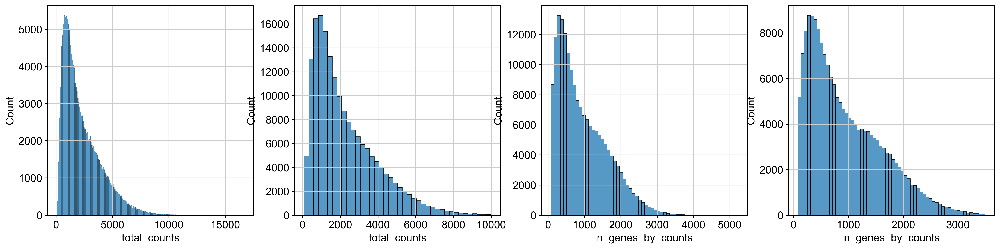

In [9]:
# Plots after filtering 
fig, axs = plt.subplots(1, 4, figsize=(22, 5))
sns.histplot(bdata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(
    bdata.obs["total_counts"][bdata.obs["total_counts"] < 10000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.histplot(bdata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(
    bdata.obs["n_genes_by_counts"][bdata.obs["n_genes_by_counts"] < 3500],
    kde=False,
    bins=60,
    ax=axs[3],
)

In [10]:
# Calculate mean UMIs/bin and genes/bin 
print('The mean UMIs/bin is:', bdata.obs['total_counts'].mean())
print('The median UMIs/bin is:', np.median(bdata.obs['total_counts']))
print('The mean genes/bin is:', bdata.obs['n_genes_by_counts'].mean())
print('The median genes/bin is:', np.median(bdata.obs['n_genes_by_counts']))

The mean UMIs/bin is: 2277.807938579051
The median UMIs/bin is: 1782.4435601527434
The mean genes/bin is: 961.0199376600245
The median genes/bin is: 788.0


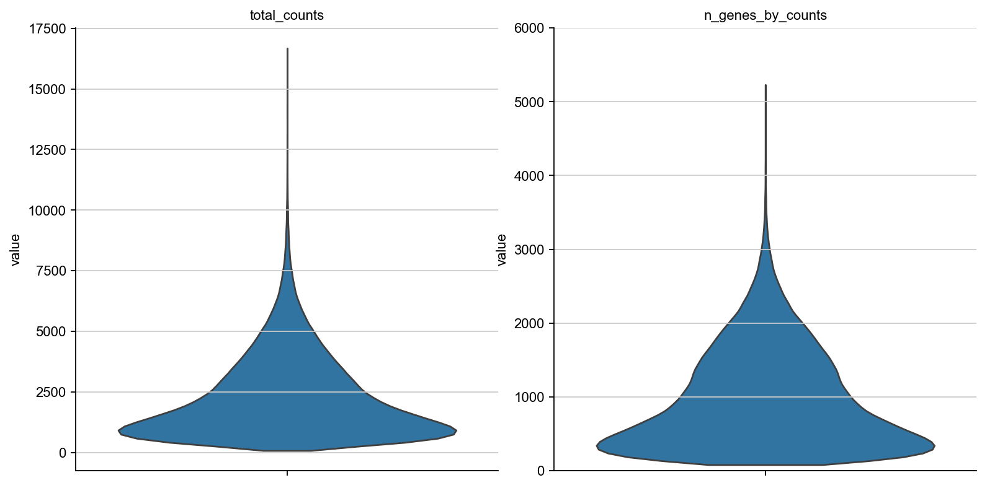

In [11]:
# Violin Plot to visualise data
sc.set_figure_params(dpi=80,fontsize=10,)
sc.pl.violin(bdata, ['total_counts', 'n_genes_by_counts'], size =0, multi_panel=True, show=False)
plt.ylim(0,6000)
plt.show()

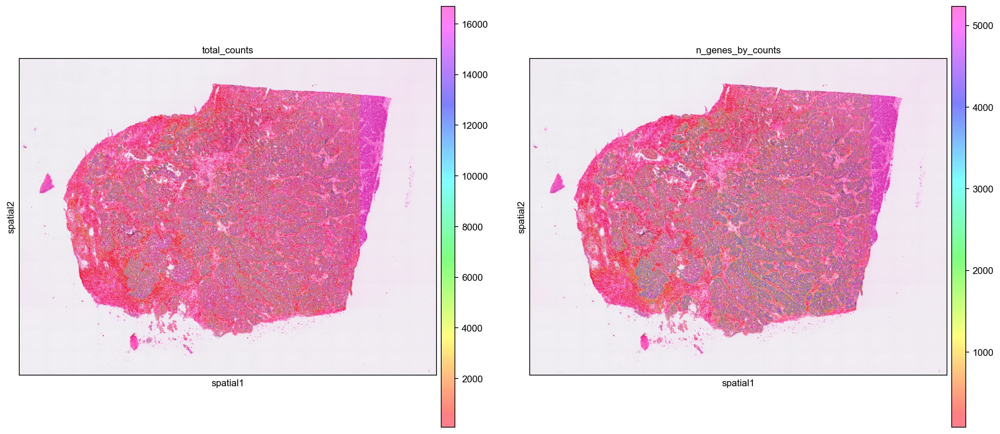

In [12]:
# Visualization in spatial coordinates 
plt.rcParams["figure.figsize"] = (8, 8)
sq.pl.spatial_scatter(bdata, img_res_key="hires", color=["total_counts", "n_genes_by_counts"], cmap="gist_rainbow", alpha=0.5)

In [13]:
# Normalize data with built-in normalize_total method from Scanpy
sc.pp.normalize_total(bdata,target_sum=1e4)
sc.pp.log1p(bdata)

# Make a copy of filtered raw data
bdata.raw = bdata.copy()

# Detect highly-variable genes, flavor='seurat_v3' mimics Seurat’s FindVariableFeatures(..., method='vst') 
sc.pp.highly_variable_genes(bdata, flavor="seurat_v3", n_top_genes=5000)

In [14]:
# Standard clustering 
sc.pp.scale(bdata, max_value=10)
sc.pp.pca(bdata, use_highly_variable=True)
sc.pp.neighbors(bdata)
sc.tl.umap(bdata)

auto.py (21): IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


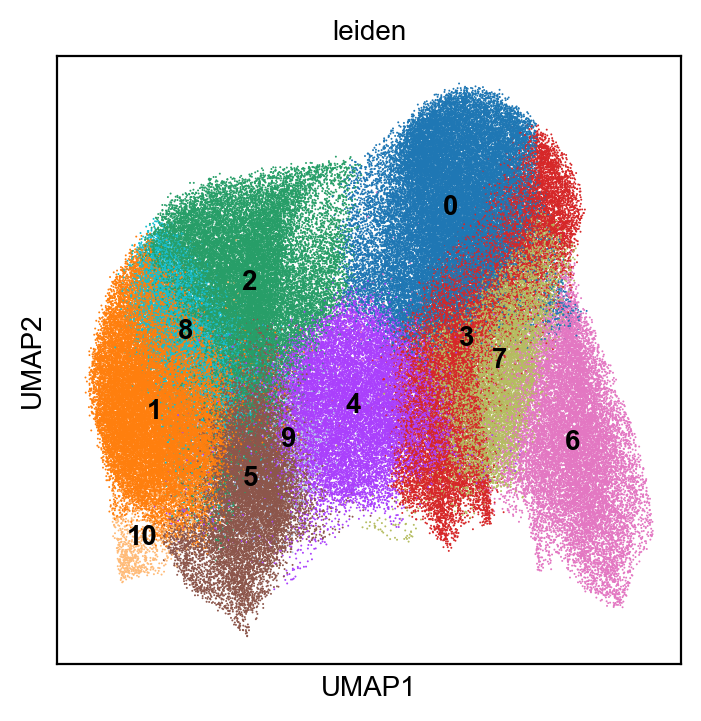

In [15]:
# Find CLusters with Leiden algorith
sc.set_figure_params(dpi=100,fontsize=10,)
sc.tl.leiden(bdata,resolution=0.65,key_added='leiden')

# Plot UMAP
sc.pl.umap(bdata,color=['leiden'],size=2,wspace=0.25,legend_loc='on data')

In [16]:
# Store the data
bdata.write('fresh_breast_b2c_scanpy.h5ad')

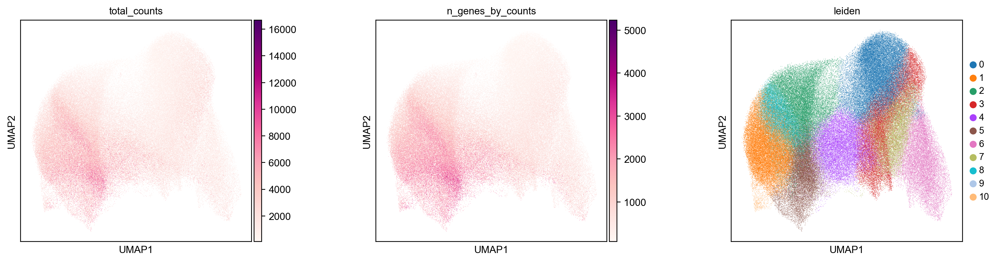

In [17]:
# Plot some covariates to check if there is any particular structure in the UMAP associated 
# with total counts and detected genes
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(bdata, color=["total_counts", "n_genes_by_counts", "leiden"], wspace=0.4)

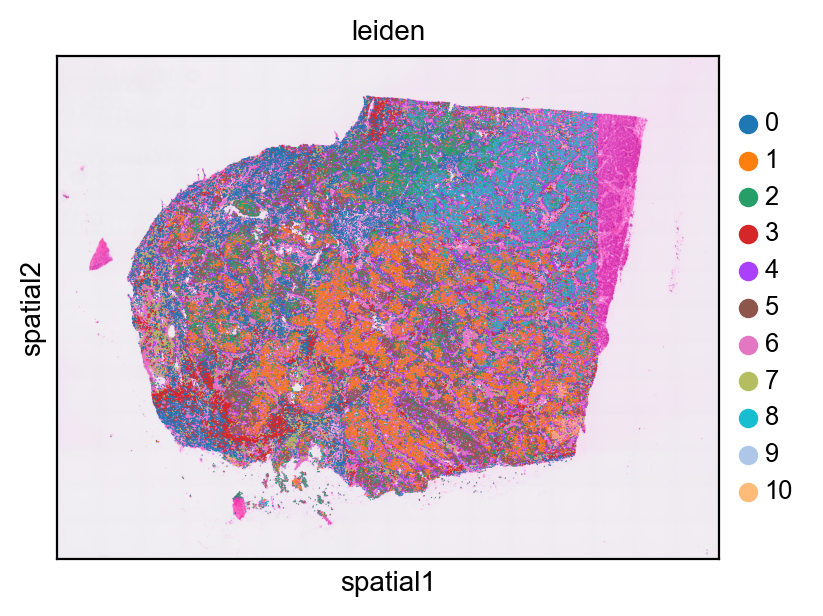

In [18]:
# Visualization clustered samples in spatial dimensions
sq.pl.spatial_scatter(bdata, img_res_key="hires", color="leiden", size=1.5)

In [19]:
# Memory
print("The memory utilized in this chunk was:", process.memory_info().rss / 1e6, "MB") # In MB 

The memory utilized in this chunk was: 26400.432128 MB


In [20]:
bdata.obs["leiden"].value_counts()

leiden
0     32149
1     25521
2     24125
3     20429
4     18034
5     16283
6     15876
7     12910
8     12292
9      1081
10      960
Name: count, dtype: int64

In [21]:
# Obtain cluster-specific differentially expressed genes
# Compute marker genes and plot a heatmap with expression levels of its top 10 marker genes across clusters
sc.tl.rank_genes_groups(bdata, "leiden", method="wilcoxon")

# Create a variable with the cluster names 
groups_all = bdata.uns["rank_genes_groups"]["names"].dtype.names

In [22]:
# Extract the markers for all the clusters
markers = sc.get.rank_genes_groups_df(bdata, group=None)
markers

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,IGHG1,206.972015,4.588083,0.000000e+00,0.000000e+00
1,0,IGKC,205.810760,4.598235,0.000000e+00,0.000000e+00
2,0,COL1A1,96.604988,1.709047,0.000000e+00,0.000000e+00
3,0,CD74,95.053223,0.795445,0.000000e+00,0.000000e+00
4,0,IGHG3,78.647766,2.215017,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...
178294,10,COL3A1,-22.516447,-2.983891,2.864355e-112,8.760061e-110
178295,10,COL1A2,-22.688572,-3.144765,5.809259e-114,1.921679e-111
178296,10,COL1A1,-24.091532,-2.757002,3.066578e-128,1.553317e-125
178297,10,IGHG1,-25.386978,-3.118500,3.512000e-142,2.108371e-139


In [23]:
# Filter the markers ["logfoldchanges"] >=1 & ["pvals_adj"] <=0.05
filt_markers = markers[(markers["logfoldchanges"] >=1) &(markers["pvals_adj"] <=0.05)] 
filt_markers

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,IGHG1,206.972015,4.588083,0.000000,0.000000
1,0,IGKC,205.810760,4.598235,0.000000,0.000000
2,0,COL1A1,96.604988,1.709047,0.000000,0.000000
4,0,IGHG3,78.647766,2.215017,0.000000,0.000000
5,0,COL1A2,77.438530,1.500037,0.000000,0.000000
...,...,...,...,...,...,...
167389,10,LYSMD1,2.390115,1.141388,0.016843,0.049593
167390,10,CCDC9B,2.389794,1.115714,0.016858,0.049627
167391,10,ZNF124,2.389464,1.308585,0.016873,0.049663
167394,10,CDC45,2.388206,1.019788,0.016931,0.049806


In [24]:
# Group by cluster, get the top 15 markers for each cluster
top15 = (filt_markers.groupby("group", group_keys=False).apply(lambda x: x.head(15)).reset_index(drop=True))

2354735784.py (2): DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


In [25]:
# For loop to extract the top markers from each cluster 
clusters = top15["group"].unique()
# Empty dictionary to save the results 
for_cluster = {} 

# Loop for each cluster 
for c in clusters: 
    subset = top15.names[top15["group"] == c]
    for_cluster[c] = subset # Save the subset per cluster

    print(f"Cluster {c}:") 
    print(subset)

Cluster 0:
0      IGHG1
1       IGKC
2     COL1A1
3      IGHG3
4     COL1A2
5      IGHA1
6     COL3A1
7      SPARC
8      IGLC1
9       IGHD
10       LUM
11      MZB1
12    TXNDC5
13      PIM2
14      IGHM
Name: names, dtype: object
Cluster 1:
15       TSKU
16       APOD
17    SULT1C3
18      MUCL1
19       PNMT
20        PIP
21     MPV17L
22        TAT
23       MLPH
24     ABCC11
25    ALDH3B2
26       AQP3
27      AZGP1
28       MUC1
29     MT-ND2
Name: names, dtype: object
Cluster 2:
30        CLU
31       CD24
32      ERBB2
33     MT-CO3
34    MT-ATP6
35     MT-ND4
36     MT-CO2
37       FASN
38     MT-CYB
39      MUCL1
40    MT-ND4L
41     MT-ND2
42       KRT7
43        LTF
44      DHRS2
Name: names, dtype: object
Cluster 3:
45      CD74
46      APOE
47      IGKC
48     IGHG1
49       LYZ
50      PSAP
51      CTSZ
52       FTL
53       VIM
54    TMSB4X
55      C1QC
56      CTSB
57      C1QA
58      CST3
59      CTSS
Name: names, dtype: object
Cluster 4:
60      APOE
61      CTSB
6

In [26]:
# Manual Annotation with PanglaoDB and CellMarker performed with 15 top genes for each cluster

In [27]:
# Change names clusters to cell types 
new_cluster_names = {
    '0' : '0.Miofibroblasto/Célula plasmática',
    '1' : '1.Célula epitelial luminal', 
    '2' : '2.Célula progenitora epitelial/Fibroblasto asoc. a cáncer',
    '3' : '3.Fibroblasto asoc. a cáncer/Célula plasmática',
    '4' : '4.Panmacrófago/Célula progenitora epitelial',
    '5' : '5.Célula progenitora epitelial/Fibroblasto asoc. a cáncer',
    '6' : '6.Miofibroblasto/Célula tipo perivascular',
    '7' : '7.Miofibroblasto/Pericito',
    '8' : '8.Célula madre cancerosa',
    '9' : '9.Célula progenitora epitelial/Célula B reguladora B10', 
    '10' : '10.Célula progenitora epitelial/Célula B reguladora B10'
}

# Replace names in bdata 

bdata.obs['leiden_celltypes'] = bdata.obs['leiden'].map(new_cluster_names).astype('category')

In [28]:
# Perform GO for each cluster using top 15 markers
gp = GProfiler(return_dataframe=True)

# Create empty dictionary to save the results per cluster 
go_results = {} 

# Loop for each cluster for the previously defined dictionary for_cluster
for cluster, genes in for_cluster.items(): 
    genes = genes.tolist()
    # Biological process (BP)
    res = gp.profile(organism="hsapiens", query=genes, sources=["GO:BP"])
    go_results[cluster] = res

    print(f"The GO results for the cluster {cluster}:")
    print(res[["name", "p_value", "source"]].head(10))

The GO results for the cluster 0:
                                                name   p_value source
0                       collagen fibril organization  0.000066  GO:BP
1           complement activation, classical pathway  0.002064  GO:BP
2  humoral immune response mediated by circulatin...  0.004962  GO:BP
3                              complement activation  0.007439  GO:BP
4                     antibacterial humoral response  0.009755  GO:BP
5                  B cell receptor signaling pathway  0.010621  GO:BP
6           cellular response to amino acid stimulus  0.022221  GO:BP
7                                 skin morphogenesis  0.025186  GO:BP
8                 cellular response to acid chemical  0.028539  GO:BP
9        transforming growth factor beta1 production  0.029755  GO:BP
The GO results for the cluster 1:
Empty DataFrame
Columns: [name, p_value, source]
Index: []
The GO results for the cluster 2:
                                                name       p_value so

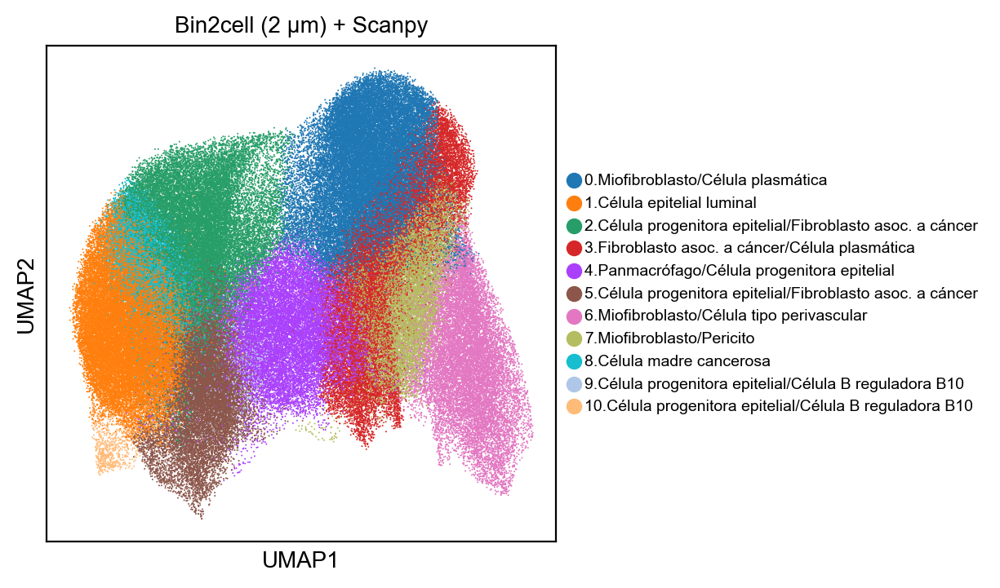

In [29]:
# Plot UMAP with cell types 
sc.pl.umap(bdata,color=['leiden_celltypes'],size=2,wspace=0.25, legend_fontsize=7, 
           title = "Bin2cell (2 µm) + Scanpy")

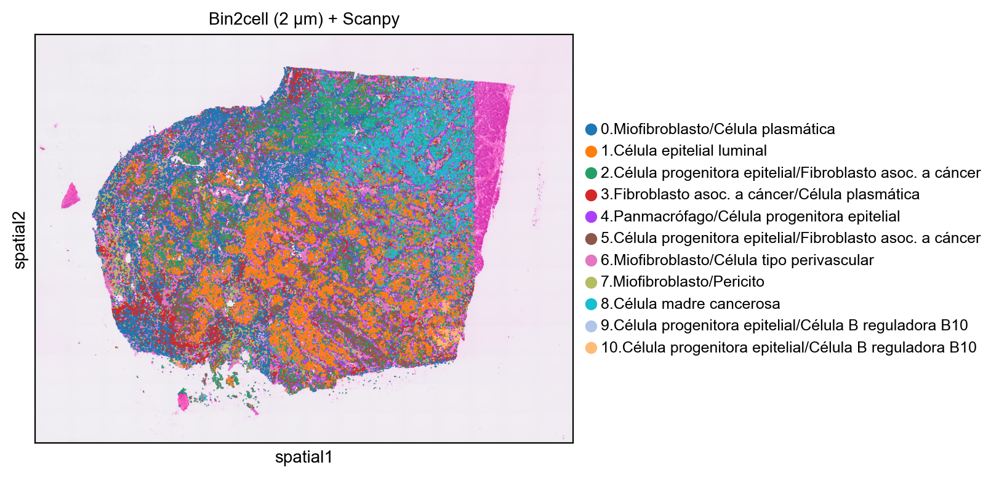

In [30]:
# Visualization clustered samples in spatial dimensions with cell types
sq.pl.spatial_scatter(bdata, img_res_key="hires", color="leiden_celltypes", size=2, 
                      figsize=(8,6),legend_fontsize=9, title = "Bin2cell (2 µm) + Scanpy")

In [31]:
# Obtain a list of top 10 gene names per cluster to plot heatmap
top_genes = filt_markers.groupby('group')['names'].apply(lambda x: x[:10]).explode().unique().tolist()

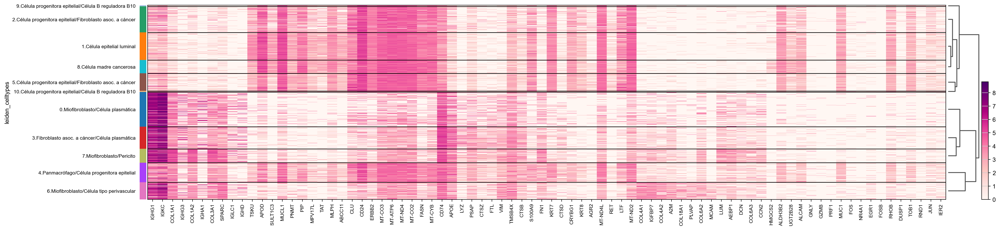

In [32]:
# Plot heatmap
sc.pl.rank_genes_groups_heatmap(bdata, groups=groups_all, var_names=top_genes,
                                groupby="leiden_celltypes", show_gene_labels=True,  
                                save = "heatmap_Bin2cell.png")

In [33]:
# End time 
end_time = time.time() 
elapsed_time = end_time - start_time 

# Print results
print(f"Total time: {elapsed_time: .2f} seconds") 

Total time:  1190.57 seconds


In [34]:
# Calculate memory information
memory = psutil.virtual_memory()
# Convert Bytes to MB (Bytes -> KB -> MB)
available = round(memory.available/1024.0/1024.0,1)
total = round(memory.total/1024.0/1024.0,1)
mem_info = str(available) + 'MB free / ' + str(total) + 'MB total ( ' + str(memory.percent) + '% used )'
# Print results
print(mem_info)

4950.7MB free / 32674.9MB total ( 84.8% used )
